# Reinforcement Learning

  

<font color="blue" size = 4> Nisarg Shah </font>

# I. Overview

The objective of the assignment is divided into solving two problems using Reinforcement learning. The first problem is developing an agent who can solve a maze and reach the goal in the minimum time and distance possible. The second problem is to make the agent learn to take appropriate bets in the game of poker to win the game with maximum balance with the agent itself. Both the problems will be solved using reinforcement learning where the agent will be trained to gain the knowledge for the respective problems and choose an appropriate action when tested. To make the agent learn I will use either of the two reinforcement learning algorithms i.e. Q- Learning or SARSA whichever will be most suitable for the respective environments.


# II. Problems 

## A. Maze Problem


### Description of the Maze Problem:
The Maze problem resembles a state where the agent will be at a particular block known as the start block and it has to reach to another particular block known as the goal node.

### Description of the GridWorld:

The maze environment will be consisting of many blocks which will include the start block, the goal block, open blocks and a few blocks with walls. When an agent is traversing and discovers a wall block it will recieve a negative reward of -5, whenever an agent lands from one open to block to another open block a reward of of -1 is given and whenever the agent reaches the goal node a reward of +30 is given. In the train function the agent explores the different paths and blocks of the maze environment and saves the reward as feedback in the Q table for future reference. As the Q table starts getting populated with more and more valyues as the iterations progresses the agent will know better which action will be more profitable because of the previously gained knowledge stored in the form of rewards in the Q table. Eventually the agent will learn how to reach the goal node in the minimum span of time and distance.

In [8]:
import collections
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Sample Grid Environment File

Simple text file with three characters, 'O', 'H', and 'G'.
- 'O': open space
- 'H': Wall or obstacles
- 'G': Goal location 

### GridWorld Class


In [9]:
# maze example
import numpy as np
import collections
class GridWorld:
    """ Grid World environment
            there are four actions (left, right, up, and down) to move an agent
            In a grid, if it reaches a goal, it get 30 points of reward.
            If it falls in a hole or moves out of the grid world, it gets -5.
            Each step costs -1 point. 

        to test GridWorld, run the following sample codes:

            env = GridWorld('grid.txt')

            env.print_map()
            print [2,3], env.check_state([2,3])
            print [0,0], env.check_state([0,0])
            print [3,4], env.check_state([3,4])
            print [10,3], env.check_state([10,3])

            env.init([0,0])
            print env.next(1)  # right
            print env.next(3)  # down
            print env.next(0)  # left
            print env.next(2)  # up
            print env.next(2)  # up

        Parameters
        ==========
        _map        ndarray
                    string array read from a file input
        _size       1d array
                    the size of _map in ndarray
        goal_pos    tuple
                    the index for the goal location
        _actions    list
                    list of actions for 4 actions
        _s          1d array
                    current state
    """
    def __init__(self, fn):
        # read a map from a file
        self._map = self.read_map(fn)
        self._size = np.asarray(self._map.shape)
        self.goal_pos = np.where(self._map == 'G')

        # definition of actions (left, right, up, and down repectively)
        self._actions = [[0, -1], [0, 1], [-1, 0], [1, 0]]
        self._s = None

    def get_cur_state(self):
        return self._s

    def get_size(self):
        return self._size

    def read_map(self, fn):
        grid = []
        with open(fn) as f:
            for line in f:
                grid.append(list(line.strip()))
        return np.asarray(grid)

    def print_map(self):
        print( self._map )

    def check_state(self, s):
        if isinstance(s, collections.Iterable) and len(s) == 2:
            if s[0] < 0 or s[1] < 0 or\
               s[0] >= self._size[0] or s[1] >= self._size[1]:
                return 'N'
            return self._map[tuple(s)].upper()
        else:
            return 'F'  # wrong input

    def init(self, state=None):
        if state is None:
            s = [0, 0]
        else:
            s = state

        if self.check_state(s) == 'O':
            self._s = np.asarray(state)
        else:
            raise ValueError("Invalid state for init")

    def next(self, a):
        s1 = self._s + self._actions[a]
        # state transition
        curr = self.check_state(s1)
        #print(curr)
        if curr == 'H' or curr == 'N':
            return -5
        elif curr == 'F':
            warnings.warn("invalid state " + str(s1))
            return -5
        elif curr == 'G':
            self._s = s1
            return 30
        else:
            self._s = s1
            return -1
        
    def is_goal(self):
        return self.check_state(self._s) == 'G'
            
    def get_actions(self):
        return self._actions

In [10]:
env = GridWorld("grid.txt")
env.print_map()

[['O' 'O' 'O' 'H' 'O' 'O' 'O' 'O' 'O']
 ['O' 'O' 'O' 'H' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'H' 'O' 'O']
 ['O' 'O' 'O' 'O' 'H' 'H' 'H' 'O' 'O']
 ['O' 'O' 'H' 'O' 'O' 'O' 'O' 'O' 'H']
 ['O' 'O' 'H' 'O' 'O' 'O' 'G' 'O' 'O']
 ['O' 'O' 'O' 'O' 'O' 'O' 'O' 'O' 'O']]


In [11]:
# top-left to (0,0)
def coord_convert(s, sz):
    return [s[1], sz[0]-s[0]-1]

## B. One-Card Poker  

![](http://www.poker-vibe.com/poker/terms/case-card/Case-Card.jpg)

<font color="red"> Game Introduction and Rules: </font>
1. This is a 1-card poker game. Where each player can blindly bet from 0 (fold), 1, 2 or 3 in the first round. In the next round only the player who havent matched the max amount( from all the players) will be given a chance to bet additional amount to match or fold. 


2. Each player will be able to see his/her own card and the total pot balance and all other player's balance and their current bet on for the round i.e this is what you can call the current state of the game. <br>

    a. <font color="red"> Example1 </font>: 3 players in game i.e. player1, computer1, computer2. First round, player1        bets 3, computer1 bets 2 and computer2 bets 1. Next round only computer1 and computer2 will be given a chance          to match the bet as player1 has max bet so computer1's available actions will be (0, 1) and computer2's                available actions will be (0, 2).<br>
    
    b. After they match or fold the result will be given. <br>
    
    c. This case is applicable for player1 being the one who needs to match. <font color="red"> Example2 </font>: 3          players in game i.e player1, computer1, computer2. First round, player1 bets 1, computer1 bets 2 and                  computer2 bets 3. Next round only player1 and computer1 will have chance to bet and match or fold. <br>
       
    d. The examples described above will be 1 round each, this will continue until player1 losses all the money or            computer1 and computer2 will be out of money. <br>
    
This is a local version of the game, your final competition if you decide to participate will be hosted on server. The local version, you can add multiple computer players in the game but only single agent.

This way you can train your agent to play against 1,2,3,4 


### Description of the Poker Problem:

In the poker problem, we create an agent and make the agent play the poker game and make it learn which will be the best possible action to bet given in a specific state by which in the end, the agent has the maximum balance and maximum wins out of all the poker rounds played.

### Description of the Poker Environment:

The poker environment will be having 2 players one will be our agent and one will be computer. We have to make the agent learn to do a bet which will make him win the round based on some specific set which defines the state of the current poker round.

## One-Card Poker Environment

In [12]:
import copy
deck = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
def draw_card():
    return deck[np.random.randint(1, 13)]

In [13]:
class Player():
    """
        
        Player class to create a player object.
        eg: player = Player("player1", start_balance = 10, is_computer = 0)
        Above declaration will be for your agent. Only one non-computer
        player allowed in the local poker instance.
        However, you can create as many as you want computer_players 
        (test for 3 players but you can try more) i.e
        computer = Player("computer", start_balance = 10, is_computer = 1).
        All the player names should be unique or else you will get error.
        
    """
    def __init__(self, player_name, start_balance = 10, is_computer = 0):
        self.player_name = player_name
        self.card = None
        self.total_balance = start_balance
        self.current_bet = 0
        self.is_computer = is_computer
        self.is_active = 0
        self.number_of_turn = 0
        self.match_bet = False
    
    def get_info(self):
        print("Player name: {}".format(self.player_name))
        print("Player card: {}".format(self.card))
        print("Player total_balance: {}".format(self.total_balance))
        print("Player is_active: {}".format(self.is_active))
        

In [14]:
class Poker():
    """
        Poker class will be the environment. 
        Important functions for users:
        1. Init Poker class i.e poker = Poker(number_of_player = 2)
           <Please dont add more than the number you declare here)
        2. add_player(player1) - adds player1 object to the game.
        3. get_current_state - gets the current state of the env
           {'other_stats': [[9, 1] ,[9, 1]], 'total_pot_balance': 2, 'player_stats': [6, 9, 1]}
           other_stats will contain the opponent information's balance and their current bet
           total_pot_balance will have total bet played by all players
           player_stats will contain player_card, player total balance, player current bet
        4. get_valid_actions -  returns the valid action available for the player
           based on balance and which round the player is in. You should take actions
           based on the return value.
           
    
    """
    def __init__(self, number_of_player = 2):
        self.all_players = []
        self.total_players = number_of_player
        self.total_pot_balance = 0
        self.player = None
        self.actions = [0, 1, 2, 3]
        self.number_of_turn = 0
        self.max_bet = 0
        
    def add_player(self, player_class):
        if player_class not in self.all_players and self.total_players > 0:
            self.all_players.append(player_class)
            self.total_players -= 1
            if player_class.is_computer == 0:
                if self.player == None:
                    self.player = player_class
                else:
                    raise Exception("Will override current player ! Only one non-computer player allowed !")
        else:
            raise Exception("Maximum number of player allowed: {}. You can increase the player count while initializing the environment".format(len(self.all_players)))
    
    def check_and_remove_players(self):
        player_remove, game_end = [], False
        for _player in self.all_players:
            if _player.total_balance <= 1:
                player_remove.append(_player)
        if len(player_remove) > 0:
            if self.player not in player_remove:
                for player in player_remove:
                    print("Removing player: {} due to insufficient funds !!".format(player.player_name))
                    self.all_players.remove(player)                    
            else:
                print("Player doesnt have balance !")
                game_end = True
                
                
    def deal(self):
        reset_game = False
        self.total_pot_balance = 0
        self.number_of_turn = 0
        
        if self.check_and_remove_players():
            reset_game = True
        else:
            if len(self.all_players) == 1:
                reset_game = True
            else:
                for _player in self.all_players:
                    if _player.total_balance > 1:
                        _player.card = draw_card()
                        _player.total_balance -= 1
                        _player.current_bet = 1
                        _player.is_active = 1
                        _player.number_of_turn = 0
                        _player.match_bet = False
                        self.total_pot_balance += 1
                        self.max_bet = 0
                    else:
                        print("{} can no longer play the game !".format(_player.player_name))
                        reset_game = True        
        return reset_game
        
    def get_current_state(self):
        current_state_dict = {}
        current_state_dict['other_stats'] = [[_player.total_balance,_player.current_bet] for _player in self.all_players if _player != self.player]
        current_state_dict['total_pot_balance'] = self.total_pot_balance
        current_state_dict['player_stats'] = [self.player.card, self.player.total_balance, self.player.current_bet]
        return current_state_dict
    
    def get_valid_actions(self, player_name):
        list_player = [_player for _player in self.all_players if _player.player_name == player_name]
        if len(list_player) == 1:
            player = list_player[0] 
            if player.number_of_turn == 0:
                if player.total_balance > 3:
                    actions =  [0, 1, 2, 3]
                elif player.total_balance <= 3:
                    if player.total_balance <= 1:
                        actions = [0]
                    elif player.total_balance > 1 and player.total_balance <= 2:
                        actions =  [0, 1]
                    else:
                        actions = [0, 1, 2]
            else:
                possible_max_bet = player.total_balance - (self.max_bet - (player.current_bet - 1))
                if possible_max_bet >= 2:
                    actions = [0, self.max_bet - (player.current_bet - 1)]
                else:
                    actions = [0]                        
            return actions
        else:
            raise Exception("Invalid player name! Use the player name defined while initialzing the environment")
    
    def print_actions(self, player, action):
        if action == 0:
            print("{} folds".format(player))
        else:
            print("{} plays {}.".format(player, action))
            
    def computer_play(self):
        list_player = [_player for _player in self.all_players if _player.player_name != self.player.player_name and _player.is_active == 1 and _player.match_bet == False]
        for player in list_player:
            actions_available = self.get_valid_actions(player.player_name)    
            print("Available actions for: {} are {}".format(player.player_name, actions_available))
            action_taken = actions_available[np.random.randint(len(actions_available))]
            self.print_actions(player.player_name, action_taken)
            if self.max_bet == 0 and action_taken != 0 or self.max_bet < action_taken:
                self.max_bet = action_taken
            self.take_action(player.player_name, action_taken)
    
    def get_player(self, player_name):
        return_player = [player for player in self.all_players if player.player_name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
        
    def take_action(self, player_name, action_taken):
        player = self.get_player(player_name)
        player.number_of_turn += 1
        if action_taken != 0:
            player.total_balance -= action_taken
            player.current_bet += action_taken
            self.total_pot_balance += action_taken
            player.is_active = 1
        else:
            player.is_active = 0
            
    def check_game(self):
        game_over = True
        if np.sum([_player.is_active for _player in self.all_players if _player != self.player]) > 0:
            game_over = False
        return game_over
     
    def return_winner(self, players):
        max_card = np.max([_player.card for _player in players])
        return [_player for _player in players if _player.card == max_card]
            

    def settle_balance(self, winner):
        reward = 0
        if winner == "draw":
            active_player = [_player for _player in self.all_players if _player.is_active]
            if len(active_player) == 0:
                print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in self.all_players]))
                winning_players = self.all_players
            else:
                print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in self.all_players if _player.is_active]))
                winning_players = self.return_winner(active_player)
                
            per_player_share = self.total_pot_balance / len(winning_players)
            for _player in winning_players:
                _player.total_balance += per_player_share
            if self.player in winning_players:
                reward = per_player_share
            else:
                reward = -self.player.current_bet
            
                
        if winner == "player":
            self.player.total_balance += self.total_pot_balance
            reward = self.total_pot_balance
            winning_players = [self.player]
            
        if winner == "computer":
            active_player = [_player for _player in self.all_players if _player != self.player and _player.is_active]
            winning_players = self.return_winner(active_player)
            per_player_share = self.total_pot_balance / len(winning_players)
            for _player in winning_players:
                _player.total_balance += per_player_share
            reward = -self.player.current_bet
            
        print("Printing winning players: {}".format(' '.join([player.player_name for player in winning_players])))
        print("Reward : {}".format(reward))
        return reward
        
    def check_game_return_reward(self, round_num):
        print("Check results for Round Number: {}".format(round_num))
        if self.check_game() and self.player.is_active == 0:
            print("Computer folds, Player folds !")
            game_over = True
            winner = "draw"
            reward = 0
            return game_over, reward, winner 
        
        elif self.check_game() and self.player.is_active:
            print("Computer folds, Player active !")
            game_over = True
            reward = self.total_pot_balance
            winner = "player"
            return game_over, reward, winner 
        
        elif not self.check_game() and self.player.is_active == 0:
            print("Computer active, Player folds !")
            game_over = True
            reward = -self.player.current_bet
            winner = "computer"
            return game_over, reward, winner 

        if round_num == 1:
            print("Computer active, Player active ! ")
            game_over = False
            reward = 0
            winner = "draw"
            return game_over, reward, winner 
        
        else:
            print("Computer active, Player active in Round 2 ! End game now !")
            game_over = True
            active_players = [player for player in self.all_players if player.is_active]
            print("Active player cards: {}".format([(_player.player_name, _player.card) for _player in active_players]))
            winning_players = self.return_winner(active_players)
            if self.player in winning_players:
                if len(winning_players) > 1:
                    reward = self.total_pot_balance / len(winning_players)
                    winner = "draw"
                else:
                    reward = self.total_pot_balance
                    winner = "player"
            else:
                reward = -self.player.current_bet
                winner = "computer"

            return game_over, reward, winner 
            

    
    def update_match(self):
        for player in [player for player in self.all_players if player.current_bet - 1 == self.max_bet]:
            player.match_bet = True
    
    def check_computer_status(self):
        computer_play = False
        if len([player for player in self.all_players if player.is_computer == 1 and player.match_bet == False and player.is_active == 1]) > 0:
            computer_play = True
        return computer_play
    
    def player_play(self, player_name, action_taken):
        game_over = False
        reward = 0  
        winner = None
        self.number_of_turn += 1
        
        if self.number_of_turn == 1:
            if self.max_bet == 0 and action_taken != 0 or self.max_bet < action_taken:
                self.max_bet = action_taken
            self.print_actions(player_name, action_taken)
            self.computer_play()
            self.take_action(player_name, action_taken)
            self.update_match()
            if self.player.is_active:
                if self.player.match_bet and not self.check_computer_status():
                    print("Player and Computer both Bet Max and match !")
                    _, reward, winner = self.check_game_return_reward(round_num=1)
                    game_over = True
            else:
                if self.check_computer_status():
                    print("Player folds, computer players are active, they will play among themselves !")
                    self.computer_play()
                game_over, reward, winner = self.check_game_return_reward(round_num=1)
                
            if game_over:
                print("Winner: {}".format(winner))
                new_reward = self.settle_balance(winner)
                if winner == "draw":
                    reward = new_reward
            else:
                if self.player.match_bet and self.check_computer_status():
                    print("Player Bet Max, computer will match now !")
                    self.computer_play()
                    game_over, reward, winner = self.check_game_return_reward(round_num=2)
                    print("Winner: {}".format(winner))
                    new_reward = self.settle_balance(winner)
                    if winner == "draw":
                        reward = new_reward
                    
            return self.get_current_state(), reward, game_over
        
        if self.number_of_turn == 2:
            self.print_actions(player_name, action_taken)
            self.take_action(player_name, action_taken)
            if self.check_computer_status():
                self.computer_play()
            game_over = True
            _, reward, winner = self.check_game_return_reward(round_num=2)
            print("Winner: {}".format(winner))
            new_reward = self.settle_balance(winner)
            if winner == "draw":
                reward = new_reward
        
        return self.get_current_state(), reward, game_over
    
    
        

### Example Run with Random Players

In [15]:
poker = Poker(number_of_player=3)
player1 = Player("Nisarg", start_balance = 10, is_computer =  0)
computer1 = Player("computer1", start_balance = 10, is_computer = 1)
computer2 = Player("computer2", start_balance = 10, is_computer = 1)
poker.add_player(player1)
poker.add_player(computer1)
poker.add_player(computer2)
while not poker.deal():
    print("-"*50)
    print("Deal Start!")
    print("Start State: {}".format(poker.get_current_state()))
    actions = poker.get_valid_actions("Nisarg")
    print("Available actions for: Nisarg are {}".format(actions))
    action_taken = actions[np.random.randint(len(actions))]
    result = poker.player_play("Nisarg", action_taken)
    while not result[-1]:
        actions = poker.get_valid_actions("Nisarg")
        print("Available actions for: Nisarg are {}".format(actions))
        action_taken = actions[np.random.randint(len(actions))]
        result = poker.player_play("Nisarg", action_taken)
    print("Final Result: {}".format(result))
    print("*"*50)
    

--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[9, 1], [9, 1]], 'total_pot_balance': 3, 'player_stats': [9, 9, 1]}
Available actions for: Nisarg are [0, 1, 2, 3]
Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: computer2 are [0, 1, 2, 3]
computer2 folds
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Final Result: ({'other_stats': [[12.0, 3], [9, 1]], 'total_pot_balance': 5, 'player_stats': [9, 9, 1]}, -1, True)
**************************************************
--------------------------------------------------
Deal Start!
Start State: {'other_stats': [[11.0, 1], [8, 1]], 'total_pot_balance': 3, 'player_stats': [12, 8, 1]}
Available actions for: Nisarg are [0, 1, 2, 3]
Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: computer2 are [0, 1, 2, 3]
c

In [16]:
poker.deal()

Player doesnt have balance !
Nisarg can no longer play the game !


True

In [17]:
poker.get_current_state()

{'other_stats': [[26.0, 1]],
 'total_pot_balance': 1,
 'player_stats': [3, 1.0, 1]}

In [19]:
poker.get_valid_actions("Nisarg")

[0]

In [20]:
poker.player_play("Nisarg", 1)

Nisarg plays 1.
Available actions for: computer2 are [0, 1, 2, 3]
computer2 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Nisarg
Reward : 2


({'other_stats': [[26.0, 1]],
  'total_pot_balance': 2,
  'player_stats': [3, 2.0, 2]},
 2,
 True)

# III. Methods

- Decide your TD learning approach: SARSA or Q-learning? 
- Describe your approach and the reason why you select it.
- Finish epsilon_greedy function and other TODOs. Explain it.
- Explain your codes.


## Review of SARSA Algorithm:

SARSA stands for State Action Reward State Action. The name itself is quite descriptive of what the algorithm does. It is an algorithm used Markov Decision Process in Reinforcement Learning. As the name suggests the algorithm SARSA states the fact that the main function for updating the Q-value depends on the current state of the agent "S1", the action the agent chooses "A1", the reward "R" the agent gets for choosing this action, the state "S2" that the agent enters after taking that action, and finally the next action "A2" the agent choose in its new state. The acronym for the quintuple (st, at, rt, st+1, at+1) is SARSA.

A SARSA agent interacts with the environment and updates the policy based on actions taken, hence this is known as an on-policy learning algorithm. It follows the following equation to update the Q table,

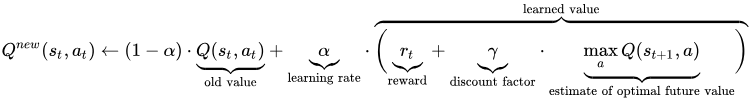

Q value for a state-action is updated by an error, adjusted by the learning rate alpha. Q values represent the possible reward received in the next time step for taking action a in state s, plus the discounted future reward received from the next state-action observation.

## Review of Q-Learning Algorithm:

Q-learning is a reinforcement learning technique used in machine learning. The goal of Q-Learning is to learn a policy, which tells an agent what action to take under what circumstances. The essential difference between SARSA and Q-Learning is that Q-learning finds a policy that is optimal in the sense that it maximizes the expected value of the total reward over all successive steps, starting from the current state.Q-learning can identify an optimal action-selection policy for any given FMDP, given infinite exploration time and a partly-random policy."Q" names the function that returns the reward used to provide the reinforcement and can be said to stand for the "quality" of an action taken in a given state.
It uses the following formula to update the Q table,

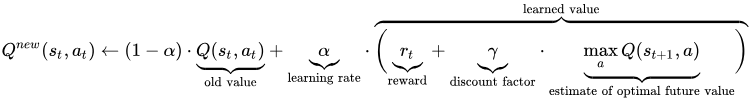

Though the formula used by both the algorithms is same the difference is in Q-Learning the test function chooses the optimum the value while in SARSA it chooses the safe value.

## Choice of TD Learning and Reason:

For the maze and the poker problem we choose the Q-learning algirthm for implementing the train functions of the problems. Because Q-learning directly learns the optimal policy and SARSA learns the near optimal policy whilst exploring.SARSA will approach convergence allowing for possible penalties from exploratory moves, whilst Q-learning will ignore them. That makes SARSA more conservative - if there is risk of a large negative reward close to the optimal path, Q-learning will tend to trigger that reward whilst exploring, whilst SARSA will tend to avoid a dangerous optimal path and only slowly learn to use it when the exploration parameters are reduced. The classic toy problem that demonstrates this effect is called cliff walking.As we are in seek of the most optimal policy in minimum iterations the choice of TD learning for this assignment is Q-Learning.

## RLAgent for Maze


In [40]:
class RLAgent: 
    """
        Reinforcement Learning Agent Model for training/testing
        with Tabular function approximation
        
    """
    
    def __init__(self, env):
        self.env = env
        self.size = env.get_size()
        self.n_a = len(env.get_actions())
        # self.Q table including the surrounding border
        self.Q = np.zeros((self.size[0], self.size[1], self.n_a))
    
    def epsilon_greed(self, epsilon, s):
#         if np.random.rand() < epsilon:
#             return np.random.randint(self.n_a)
#         else:
        return np.argmax(self.Q[s[0],s[1],:])
                # TODO: Finish this function
    
    def train(self, start, **params):
        
        # parameters
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 100) 
        maxstep= params.pop('maxstep', 1000)
        
        # init self.Q matrix
        self.Q[...] = 0     
        self.Q[0,:,2].fill(0)
        self.Q[:,0,0].fill(0) 
        self.Q[-1,:,3].fill(0) 
        self.Q[:,-1,1].fill(0) 
        self.Q[self.env._map == 'H'] = -np.inf
        
        
        # online train
        # rewards and step trace
        rtrace = []
        steps = []
        for j in range(maxiter):

            env.init(start)
            s = env.get_cur_state()
            # selection an action
            a = self.epsilon_greed(epsilon, s)
            rewards = []
            trace = np.array(coord_convert(s, self.size))
            # run simulation for max number of steps 
            for step in range(maxstep):
                # move
                r = env.next(a)
                s1 = env.get_cur_state()
                a1 = self.epsilon_greed(epsilon, s1)
                rewards.append(r)
                trace = np.vstack((trace, coord_convert(s1, self.size)))

                # TODO: FINISH SARSA/Q-learning Rule here
                # update self.Q table 
                #print(self.Q[s,a])
        
                self.Q[s[0],s[1], a] += alpha * (r + gamma * np.max(self.Q[s1[0],s1[1], :]) - self.Q[s[0],s[1],a])
                
                
                if env.is_goal(): # reached the goal
                    # TODO: Why is this zero? Describe this in your code explanation.
                    self.Q[s1[0], s1[1], a1] = 0
                    break

                s = s1
                a = a1
            rtrace.append(np.sum(rewards))
            steps.append(step+1)
            
        return rtrace, steps, trace # last trace of trajectory

    def test(self, start, maxstep=1000):
        env.init(start)
        s = env.get_cur_state()

        trace = np.array(coord_convert(s, self.size))
        # run simulation for max number of steps 
        for step in range(maxstep):
            # move
            
            # selection an action
            a = np.argmax(self.Q[s[0],s[1],:])
            r = env.next(a)
            trace = np.vstack((trace,coord_convert(s,self.size)))
            s = env.get_cur_state()
            
            if env.is_goal(): # reached the goal
                trace = np.vstack((trace,coord_convert(s,self.size)))
                break
        return trace
        # last trace of trajectory
        # TODO: Add your test routine that exmines learned policy    

###  Explanation of Maze Code

The maze code consists of four functions namely the _init_() function, the epsilon_greedy(), the train() function, the test() function. 

The _init_() function initialises the variables mentioned in the function whenever the new agent class is built.

The train() function the environment is first initialised and then the current state is saved in a variable s. Then we select the optimum action for that particular state by sending the state to the epsilon_greedy() function. The epsilon_greedy() function returns the best appropriate action for the particular state. This process continues for every new state the agent visits in every step. After every step taken we update the Q table with the Q-Learning update formula. __Then we check if the agent has reached the goal node or no, and if the agent has reached the goal node then we perform the following action self.Q[s1[0], s1[1], a1] = 0. We perform the mentioned action because that action sets the action to stop for that particular node so that the agent does not move form the goal node once it reaches the goal node.The function breaks out of the for loop of maxsteps if goal node is reached.__ Then we append rewards in rtrace array and steps in steps array and returns rtrace, trace and steps.

The test() function is similar to the train function just in this function we do not update the Q-table in every iteration and we do not have the for loop with max iteration as we are not training the agent, we are testing the agent. The test() function returns trace variable for plotting the trace to reach the goal node.

## RLAgent for One-Card Poker

In [22]:
import pdb
class PAgent: 
    """
        Reinforcement Learning Agent Model for training/testing
        with Tabular function approximation
        
    """
    
    def __init__(self, ):
        
        
        #self.n_a = len(poker1.get_valid_actions())
        # self.Q table including the surrounding border
        deck= [1,2,3,4,5,6,7,8,9,10,11,12,13]
        allpossibleactions = [0,1,2,3]
        self.Q = np.random.rand(14,30,7,4)
    
    def epsilon_greed(self, epsilon, s):
        if np.random.rand() < epsilon:
            return np.random.randint(0,3)
        else:
            return np.argmax(self.Q[s[0],s[1],s[2],:])
                # TODO: Finish this function
    
    def train(self,**params):
        
        # parameters
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 100) 
        maxstep= params.pop('maxstep', 1000)
        # online train
        # rewards and step trace
        for j in range(maxiter):
            player1 = Player("Agent_Nisarg", start_balance = 10, is_computer =  0)
            computer1 = Player("computer1", start_balance = 10, is_computer = 1)
            poker1 = Poker(number_of_player=2)
            poker1.add_player(player1)
            poker1.add_player(computer1)
            rewards = []
            s=[]
            s1= []
            # run simulation for max number of steps 
            while not poker1.deal():
                # move
                total_pot_balance = poker1.total_pot_balance
                current_bet = poker1.player.current_bet
                card = poker1.player.card
                s.append(card)
                s.append(total_pot_balance)
                s.append(current_bet)
                
                
            # selection an action
                a = self.epsilon_greed(epsilon, s)
                result = poker1.player_play(player1.player_name,a)
                r = result[1]
                total_pot_balance = poker1.total_pot_balance
                current_bet = poker1.player.current_bet
                card = poker1.player.card
                s1.append(card)
                s1.append(total_pot_balance)
                s1.append(current_bet)
                self.Q[s[0],s[1],s[2],a] += alpha * (r + gamma * np.max(self.Q[s1[0],s1[1],s1[2],:]) - self.Q[s[0],s[1],s[2],a])
                s = s1
                while not result[-1]:
                    actions = poker1.get_valid_actions("Agent_Nisarg")
                    print("Available actions for: Agent_Nisarg are {}".format(actions))
                    action_taken = self.epsilon_greed(epsilon, s)
                    result = poker1.player_play("Agent_Nisarg", action_taken)
                    r = result[1]
                    total_pot_balance = poker1.total_pot_balance
                    current_bet = poker1.player.current_bet
                    card = poker1.player.card
                    s1.append(card)
                    s1.append(total_pot_balance)
                    s1.append(current_bet)
                    a1 = self.epsilon_greed(epsilon, s1)
                    self.Q[s[0],s[1],s[2],a] += alpha * (r + gamma * np.max(self.Q[s1[0],s1[1],s1[2],:]) - self.Q[s[0],s[1],s[2],a])
                    
                    s = s1
                    a = a1
        return r
    def test(self, maxstep=1000):
        #epsilon = 0.1
        #env.init(start)
        player1 = Player("Agent_Nisarg", start_balance = 10, is_computer =  0)
        computer1 = Player("computer1", start_balance = 10, is_computer = 1)
        poker1 = Poker(number_of_player=2)
        poker1.add_player(player1)
        poker1.add_player(computer1)
        rewards = []
        s=[]
        s1= []
        #trace = np.array(coord_convert(s, self.size))
        # run simulation for max number of steps 
        while not poker1.deal():
            # move
            total_pot_balance = poker1.total_pot_balance
            current_bet = poker1.player.current_bet
            card = poker1.player.card
            s.append(card)
            s.append(total_pot_balance)
            s.append(current_bet)


        # selection an action
            a = self.epsilon_greed(0, s)
            result = poker1.player_play(player1.player_name,a)
            r = result[1]
            total_pot_balance = poker1.total_pot_balance
            current_bet = poker1.player.current_bet
            card = poker1.player.card
            s1.append(card)
            s1.append(total_pot_balance)
            s1.append(current_bet)
            s = s1
#                 a = a1
            while not result[-1]:
                actions = poker1.get_valid_actions("Agent_Nisarg")
                print("Available actions for: Agent_Nisarg are {}".format(actions))
                action_taken = self.epsilon_greed(0, s)
                result = poker1.player_play("Agent_Nisarg", action_taken)
                r = result[1]
                total_pot_balance = poker1.total_pot_balance
                current_bet = poker1.player.current_bet
                card = poker1.player.card
                s1.append(card)
                s1.append(total_pot_balance)
                s1.append(current_bet)
                a1 = self.epsilon_greed(0, s1)

                s = s1
                a = a1
        return result
        

### Explanantion of Poker Code


The maze code consists of four functions namely the _init_() function, the epsilon_greedy(), the train() function, the test() function. 

The _init_() function initialises the variables mentioned in the function whenever the new agent class is built.

The train() function runs for maxiter times as the whole function consists of a for loop which runs for maxiter times. First we create the players where one player is the agent and the second one is the computer. Then we call the poker class and add the two players to play the game. Then we start the game by calling poker.deal() function. We take the three parameters total_pot_balance, card, current_bet for the Q table and the 4th parameter is the action which is to be performed which is random for the first iteration. we store them in a list s and pass it to the epsilon_greedy() function for an appropriate action. The we store the result and we store the winning attribute in variable r. Then we update the Q table with the Q-learning update formula. Then we complete the same process while result[-1] is not true. This function returns r that is the winning attribute.

The test() function is similar to the train function just in this function we do not update the Q-table in every iteration and we do not have the for loop with max iteration as we are not training the agent, we are testing the agent. We run the same code but only for one iteration. The test() function returns result variable for plotting the winning percentage histogram.

# IV - Results


### Utility functions for Plotting

- finish the TODOs here for plotting

In [23]:
### Plotting tools 
from matplotlib import pyplot as plt
def plot_trace(agent, start, trace, title="test trajectory"):
    plt.plot(trace[:, 0], trace[:, 1], "ko-")
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.xlim([0, agent.size[1]])
    plt.ylim([0, agent.size[0]])
    

def plot_train(agent, rtrace, steps, trace, start):

    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(221)
    #print(rtrace)
    ax.plot(rtrace)
    # TODO: plot rewards 
    
    plt.ylabel("sum of rewards")

    ax1 = fig.add_subplot(222)
    #print(steps)
    ax1.plot(steps)
    # TODO: plot steps
    
    plt.ylabel("# steps")

    # contour plot for agent.Q
    ax2 = fig.add_subplot(223)
    xs = range(agent.size[1])
    ys = range(agent.size[0])
    maxQ = np.max(agent.Q, axis=2)
    h_b = (maxQ==-np.inf)
    maxQ[h_b] = 0
    maxQ[h_b] = np.min(maxQ) - 100
    cs = plt.contourf(xs, ys[::-1], maxQ)
    plt.colorbar(cs)
    plt.text(env.goal_pos[1], agent.size[0]-env.goal_pos[0]-1, 'G')
    plt.text(start[1], agent.size[0]-start[0]-1, 'S')
    plt.ylabel("max agent.Q")

    # plot traces
    ax3 = fig.add_subplot(224)
    plot_trace(agent, start, trace, "trace of the last episode")

    plt.plot()

## Training and Testing with GridWorld


## Choice of Parameters for Maze Agent


In [24]:
env = GridWorld("grid.txt")
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.1, 
                                   epsilon=0.07, 
                                   maxiter=100, 
                                   maxstep=1000)

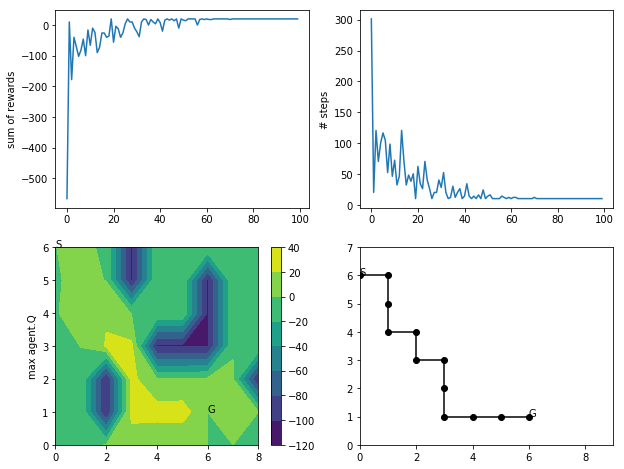

In [25]:
plot_train(agent, rtrace, steps, trace, start)

In [26]:
env = GridWorld("grid.txt")
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.5, 
                                   alpha=0.8, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)


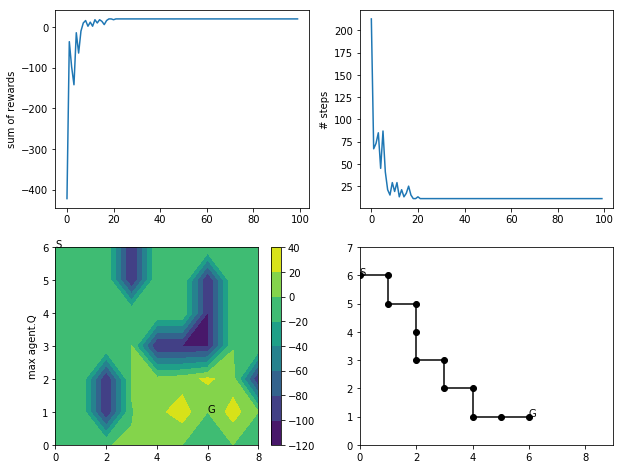

In [27]:
plot_train(agent, rtrace, steps, trace, start)

In [28]:
env = GridWorld("grid.txt")
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.99, 
                                   alpha=0.1, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)


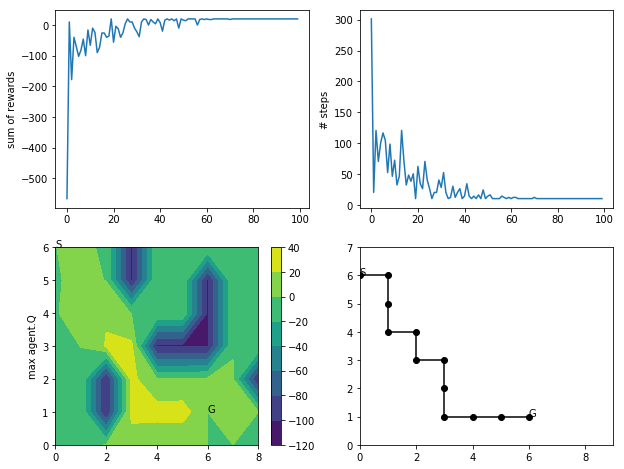

In [29]:
plot_train(agent, rtrace, steps, trace, start)

## Final Choice of Parameters for Maze Agent

The final choice of parameters for the maze agent are as follows,

epsilon = 0.1

gamma = 0.5

alpha = 0.8

because these parameters gives better output than other tested parameters. It converges fast and in minimum amount of iterations which helps the agent to learn faster and in an efficient way.
If we want more of exploration and want to train the function for multiple start points then one should probably go with the following parameters,

gamma=0.99

alpha=0.1

epsilon=0.07

In [30]:
env = GridWorld("grid.txt")
agent = RLAgent(env)
start = [0,0]
rtrace, steps, trace = agent.train(start, 
                                   gamma=0.5, 
                                   alpha=0.8, 
                                   epsilon=0.1, 
                                   maxiter=100, 
                                   maxstep=1000)

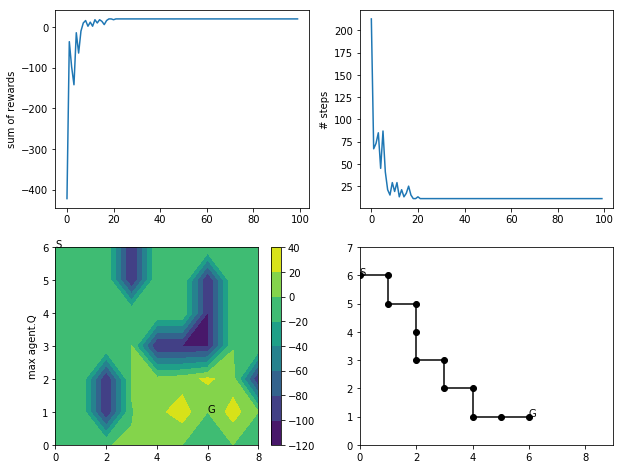

In [31]:
plot_train(agent, rtrace, steps, trace, start)

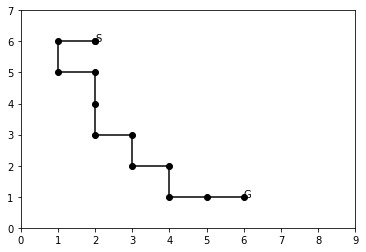

In [32]:
test_start = [0,2]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

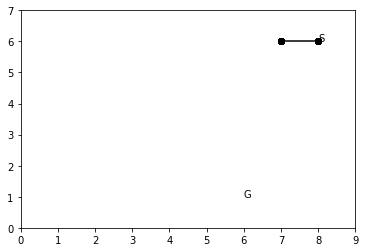

In [33]:
test_start = [0,8]
test_trace = agent.test(test_start)
plot_trace(agent, test_start, test_trace)

## Choice of Parameters for Maze Agent


In [34]:
pagent = PAgent()
pagent.train(gamma=0.99, 
             alpha=0.1, 
             epsilon=0.07, 
             maxiter=100, 
             maxstep=1000)

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
comp

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available a

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: c

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 11)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check

Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 13)]
Winner: comput

Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 7)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Compute

Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 9)]
Printing winning players: computer1
Reward : -4
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg'

Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
compute

-3

In [35]:
rtest=[]
for i in range(1000):
    result = pagent.test()
    rtest.append(result[0]['player_stats'][1] > 0)

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 6)]
Winner:

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 6)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: compute

Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg play

Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisa

Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2,

Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player activ

Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 3.
Available actions 

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 9)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Ro

Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 7)]
Printing winni

Active player cards: [('Agent_Nisarg', 4), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !

Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 8)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available

Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game 

Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 12)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions fo

Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players:

Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), (

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Roun

Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printi

Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player 

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 4)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check

Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: comput

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 8)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 7)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printi

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check 

Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 7)]
Winner: computer
Printing winnin

Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('compute

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active pla

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer b

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 8)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient fu

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 11)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Remov

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max,

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to i

computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
com

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Rewa

Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Ro

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [

Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisa

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 8)]
Winner: compu

Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [

computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results

Active player cards: [('Agent_Nisarg', 7), ('computer1', 7)]
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 6)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game no

Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Be

computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 6)]
Printing winning players: computer1
Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer 

computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 7)]

Active player cards: [('Agent_Nisarg', 8), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: compute

Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Roun

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Compute

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available action

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 8)]
Winner: player
Printing winning players: Agen

Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check result

Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
C

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available a

Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Ni

Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both 

Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 9)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer

Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 6)]


Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner:

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [(

Active player cards: [('Agent_Nisarg', 9), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 6)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: comp

Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Av

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 

Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, P

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number:

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
A

Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 10)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check result

Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: comput

Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and

Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning play

Winning Percentage
90.4 %


Text(0,0.5,'Results')

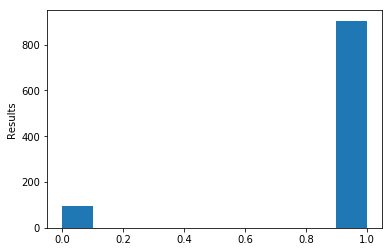

In [36]:
print("Winning Percentage")
print(np.sum(rtest)/len(rtest)*100,"%")

plt.hist(rtest)
plt.ylabel("Results")

In [37]:
pagent = PAgent()
pagent.train(gamma=0.5, 
             alpha=0.8, 
             epsilon=0.1, 
             maxiter=100, 
             maxstep=1000)

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), (

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 

Printing winning players: Agent_Nisarg
Reward : 4.0
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: comput

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and

Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1


Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 8)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Comput

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 10)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg play

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Ro

3

In [38]:
rtest=[]
for i in range(1000):
    result = pagent.test()
    rtest.append(result[0]['player_stats'][1] > 0)

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer

Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available act

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Pl

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Play

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winnin

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 a

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]


Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player a

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both

Reward : 8.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active pla

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active i

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: c

computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active p

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: comput

Active player cards: [('Agent_Nisarg', 5), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 9)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds 

Active player cards: [('Agent_Nisarg', 8), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds 

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)

Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
comput

Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Ag

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 6)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agen

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 8)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player 

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player

computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Compu

Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2,

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Winner: player
Printing winning players: 

Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2

computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]


Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 8)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and 

Printing winning players: computer1
Reward : -3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Ni

Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays

Active player cards: [('Agent_Nisarg', 3), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('co

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10)

Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2,

Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 10)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !


Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Ni

Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer

Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 6)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Prin

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active pl

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient

Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nis

Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winn

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -5
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 1.
Available actions for: com

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Availabl

Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 6)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0,

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 11)]
Printing winning players: computer1
Reward : -4
Player doesnt have balance !
Agent_Nisarg can no longer play the game !


Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Ag

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3)]
Printing winning players: Agent_Nisarg computer1
Rewa

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [

Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
co

Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Playe

Active player cards: [('Agent_Nisarg', 7), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg pla

Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 6)]
Winner: computer
Printing winning

Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg p

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1]
computer1 folds
Player

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 5)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 11)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 2)]
Winner: player
Prin

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active

Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 9)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 8)]
Winner: play

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
P

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for 

Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Availabl

Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results fo

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players

Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer fo

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 6)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available action

Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer bot

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('

Reward : 4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 8)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: com

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 11)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Rou

Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 fo

computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Re

Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Winner: computer
Printing winning players: computer1
Reward : -3
A

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available a

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisa

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Availab

Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agen

Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 9)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Ch

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer act

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: compute

Winning Percentage
91.10000000000001 %


Text(0,0.5,'Results')

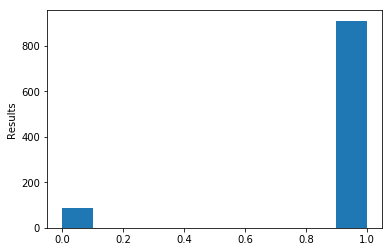

In [39]:
print("Winning Percentage")
print(np.sum(rtest)/len(rtest)*100,"%")

plt.hist(rtest)
plt.ylabel("Results")

In [814]:
pagent = PAgent()
pagent.train(gamma=0.8, 
             alpha=0.5, 
             epsilon=0.5, 
             maxiter=100, 
             maxstep=1000)

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg


Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Play

Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Printing winning players

Printing winning players: computer1
Reward : -3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 10
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Winner: player
Printing winning players

Reward : 3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 8)]
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 8)]
Printing wi

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 3)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg

Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check resul

Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 6)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Avail

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and matc

computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg 

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Print

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check resu

5

In [815]:
rtest=[]
for i in range(1000):
    result = pagent.test()
    rtest.append(result[0]['player_stats'][1] > 0)

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 10)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning player

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Printing winning 

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer fold

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, 

computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: comp

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Age

Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions fo

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0,

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Playe

Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available a

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available ac

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Printing winning players: computer1
Reward : -2
Agent

Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 7)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 2.
Check results for Round Number: 

computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 6)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Ag

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 12)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0,

Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1'

Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Ch

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round N

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Playe

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer w

computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Comp

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('compute

Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nis

Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 3)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 11)]
Printing wi

Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Pri

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Nu

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in 

Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Num

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0,

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 11)]
Printing winning play

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End g

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Rewa

Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player a

Active player cards: [('Agent_Nisarg', 7), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: pla

Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Rew

Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 11)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg play

Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Compute

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 10)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: compute

Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Num

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 12)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Co

Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds 

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: comput

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer 

Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: 

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 7)]

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Num

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1,

Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 

computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg play

computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 12)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 2)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available ac

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: co

Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 6)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available ac

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available action

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 6)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Winner: comp

Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players

Winning Percentage
88.9 %


Text(0,0.5,'Results')

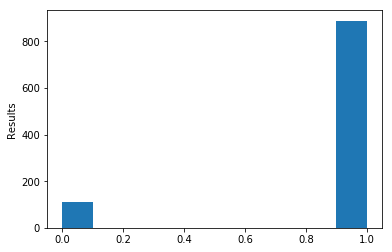

In [816]:
print("Winning Percentage")
print(np.sum(rtest)/len(rtest)*100,"%")

plt.hist(rtest)
plt.ylabel("Results")

## Final Choice of Parameters for Maze Agent

The final choice of parameters for the maze agent are as follows,

epsilon = 0.1

gamma = 0.5

alpha = 0.8

because these parameters gives better output than other tested parameters. The winning ratio is better with these parameters than all other tested parameters. The winning ratio with these parameters is 92.2%

In [817]:
pagent = PAgent()
pagent.train(gamma=0.5, 
             alpha=0.8, 
             epsilon=0.1, 
             maxiter=100, 
             maxstep=1000)

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer activ

Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 8)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 5)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 

Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: compute

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
P

Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Pla

Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 7)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 9)]
Printing winning player

Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Rou

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Com

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 13)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player

Active player cards: [('Agent_Nisarg', 8), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds 

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 a

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Chec

4

In [818]:
rtest=[]
for i in range(1000):
    result = pagent.test()
    rtest.append(result[0]['player_stats'][1] > 0)

Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !


Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 4)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Availabl

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 9)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
c

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 3)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 8)]
Winner: computer
Printing winning players: computer1
Reward : -3


Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
compute

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2,

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player c

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printi

Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Ag

Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.5
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('compute

Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer

Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
comp

computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 9)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 5)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available act

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 7)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 pla

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Ag

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 11)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both B

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 11), ('computer1', 8)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 pl

Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winne

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check r

Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are 

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Comput

computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 3)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available acti

Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg pl

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 13)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 2)]
Winner: player
Printing winning players: A

Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions f

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player f

Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg folds
Check results for Round Number: 2
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -2
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 13)]
Printing winning players: Agent_Nisarg comput

computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 

Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for:

Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 2)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Be

Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results fo

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 3.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1


Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Availabl

Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !


Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: c

Active player cards: [('Agent_Nisarg', 13), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 11)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
P

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 7)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 play

Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 12), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer

Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 6)]
Printing winning players: Agent_Nisarg computer1
Reward : 2.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End 

Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 8)]
Printing winning players: computer1
Reward : -4
Player do

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Play

computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round 

Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player a

Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winn

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 4.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are 

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Rew

Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 7)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 2]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Com

Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 4), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 3)]
Printing winning players: Agent_Nis

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 4)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 9), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 8)]
Printing winning players: Agent_Nisarg
Reward : 6.0
Agent_Nisarg plays 2.
Available actions for: comput

Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 13)]
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: com

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 10)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 7)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round

Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer act

Winner: draw
Active player cards: [('Agent_Nisarg', 6), ('computer1', 4)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 13)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
co

Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 10)]
Printing winning players: Agent_Nisarg
Reward : 8.0
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 3)]
Winner

Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 13)]
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 5), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -4
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 11), ('computer1', 2)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: co

Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 11)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 8), ('computer1', 5)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 3), ('computer1', 8)]
Pr

Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 4), ('computer1', 3)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 8
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 7
Agent_Nisarg plays 3.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 2]
computer1 plays 2.
Check results for Round Number: 2
Computer active, Player active 

Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 5
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Pl

Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player f

Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, com

Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Removing player: computer1 due to insufficient funds !!
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 8), ('computer1', 8)]
Printing winning players: Agent_Nisarg computer1
Reward : 3.0
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 5)]
Winner: computer
Printin

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 10), ('computer1', 3)]
Printing winning players: Agent_Nisarg
Reward : 4.0
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 3
Agent_Nisa

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 13), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 5), ('computer1', 2)]
Printing winning players: Agent_Nisarg

Check results for Round Number: 1
Computer folds, Player active !
Winner: player
Printing winning players: Agent_Nisarg
Reward : 4
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 13), ('computer1', 9)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 6), ('computer1', 12)]
Winner: computer
Printing winning players: computer1
Reward : -5
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, co

Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 2), ('computer1', 11)]
Winner: computer
Printing winning players: computer1
Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 6)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 6
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player and Computer both Bet Max and match !
Check results for Round Number: 1
Computer active, Player active ! 
Winner: draw
Active player cards: [('Agent_Nisarg', 7), ('computer1', 12)]
Printing winning players: computer1
Reward : -2
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
compu

Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round 

Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 12), ('computer1', 5)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 2.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printin

Reward : -3
Agent_Nisarg plays 1.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0]
Agent_Nisarg plays 1.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 7), ('computer1', 9)]
Winner: computer
Printing winning players: computer1
Reward : -3
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 folds
Check results for Round Number: 1
Computer folds, Player folds !
Winner: draw
Active player cards: [('Agent_Nisarg', 2), ('computer1', 12)]
Printing winning players: Agent_Nisarg computer1
Reward : 1.0
Agent_Nisarg folds
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Check results for Round Number: 1
Computer active, Player folds !
Winner: computer
Printing winning players: computer1
Reward : -1
Agent_Nisarg folds
Available actio

Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 3), ('computer1', 10)]
Winner: computer
Printing winning players: computer1
Reward : -5
Player doesnt have balance !
Agent_Nisarg can no longer play the game !
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 3.
Available actions for: Agent_Nisarg are [0, 1]
Agent_Nisarg plays 2.
Check results for Round Number: 2
Computer active, Player active in Round 2 ! End game now !
Active player cards: [('Agent_Nisarg', 9), ('computer1', 4)]
Winner: player
Printing winning players: Agent_Nisarg
Reward : 9
Agent_Nisarg plays 2.
Available actions for: computer1 are [0, 1, 2, 3]
computer1 plays 1.
Player Bet Max, computer will match now !
Available actions for: computer1 are [0, 1]
computer1 folds
Check results for Round Number: 2
Computer folds, Player active !
W

Winning Percentage
93.0 %


Text(0,0.5,'Results')

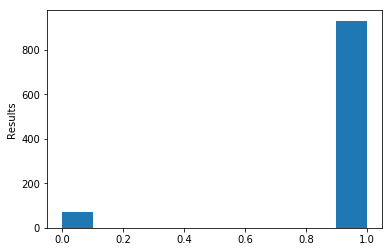

In [819]:
print("Winning Percentage")
print(np.sum(rtest)/len(rtest)*100,"%")

plt.hist(rtest)
plt.ylabel("Results")

### Reading and Analysis from learning result for maze problem

From the final output graph of the maze problem we can understand that the agent learns the optimum policy within the first 20 iterations itself by the virtue of the given parameters which set perfectly for the given problem. From the contour plot of the maze agent it is clear that this agent does less of exploration but if the agent has to travel from the same start point then this policy is quite optimum.

### Reading and Analysis from learning result for poker problem

From the histogram plots for the poker problem we understand the winning percentage of the agent. The different parameters we tried and the respective output we get resembles how good our agent learns. If the winning percentage of the agent is good for particular parameters then that parameters are selected for the final results.

# V. Conclusions

I learnt how to implement the Q-learning Reinfrcement algorithm by implementing it to train the agents for the maze problem and the Poker problem. It was a very challenging assignment. I learnt the exploring and exploiting process and also how to plot the traces of the rewards and the steps for the maze agent. The challenging part was to define the Q table for the poker problem which i resolved it after doing a bit research on the skeleton of the Q-table and how the Qtable is used in the test function as policy. I reviewed the poker code to understand which of the statistics are necessary for the Q-table. Overall this assignment gave me the real insight and hands on experience of Machine learning can be used in the real world.